# Incorporating Bed Topography into a Shallow-Ice Approximation Model

Caitlin Locke <br />
Glaciology Final Project <br />
Spring 2023 <br />

## 1) Final Project Information

## Background and Motivation

For our Shallow Ice Approximation model, we assumed a flat bed topography. In reality, ice sheets do not flow over a flat bed, but a varying bed topography. Beneath the Antarctic Ice Sheet, the bed topography is dynamic and geologically controlled.

## Scientific Question

How does the addition of bed topography effect our model results and ice sheet dynamics? In particular, how do different bed topography geometries effect ice sheet dynamics in different Antarctic drainage systems in Antarctica?

## Datasets

1. [Bedmap2 - Ice thickness and subglacial topographic model of Antarctica](https://www.bas.ac.uk/project/bedmap-2/)
1. [MEaSUREs BedMachine Antarctica, Version 3](https://nsidc.org/data/nsidc-0756/versions/3)
1. [MEaSUREs Antarctic Boundaries for IPY 2007-2009 from Satellite Radar, Version 2](https://nsidc.org/data/nsidc-0709/versions/2)

## Summary of Analysis

I will write a new spatially-varying bed function that allows the bed elevation to vary over distance, and I will incorporate bed topography data from BedMap2 and Bedmachine2 into my shallow-ice approximation model. To do this I will sample BedMap2 and BedMachine3 bed topography onto lines generated from two points picked using the interactive code from Jonny Kingslake's Glaciology Practical 5 in order to examine the model output over different bed topographies in Antarctica. Once these two steps are completed, I will overlay the Antarctic drainage systems from Zwally et al., 2012 on the Bedmap2 and BedMachine2 bed topography and run the model over multiple major drainage basins in order to examine the effect of different bed topography geometries on ice sheet dynamics in these regions. 


## References

1. Fretwell, P., Pritchard, H. D., Vaughan, D. G., Bamber, J. L., Barrand, N. E., Bell, R., Bianchi, C., Bingham, R. G., Blankenship, D. D., Casassa, G., Catania, G., Callens, D., Conway, H., Cook, A. J., Corr, H. F. J., Damaske, D., Damm, V., Ferraccioli, F., Forsberg, R., … Zirizzotti, A. (2013). Bedmap2: Improved ice bed, surface and thickness datasets for Antarctica. The Cryosphere, 7(1), 375–393. https://doi.org/10.5194/tc-7-375-2013
1. Morlighem, M. (2022). MEaSUREs BedMachine Antarctica, Version 3 [Data Set]. Boulder, Colorado USA. NASA National Snow and Ice Data Center Distributed Active Archive Center. https://doi.org/10.5067/FPSU0V1MWUB6. Date Accessed 05-05-2023.
1. Mouginot, J., B. Scheuchl, and E. Rignot. (2017). MEaSUREs Antarctic Boundaries for IPY 2007-2009 from Satellite Radar, Version 2 [Data Set]. Boulder, Colorado USA. NASA National Snow and Ice Data Center Distributed Active Archive Center. https://doi.org/10.5067/AXE4121732AD. Date Accessed 05-05-2023.
1. Zwally, H. Jay, Mario B. Giovinetto, Matthew A. Beckley, and Jack L. Saba, 2012, Antarctic and Greenland Drainage Systems, GSFC Cryospheric Sciences Laboratory, at http://icesat4.gsfc.nasa.gov/cryo_data/ant_grn_drainage_systems.php.

## 2) Register for an Earthdata Login to download a few of the datasets in this notebook
Navigate to the [Earthdata Login Page](https://urs.earthdata.nasa.gov/) and register for an Earthdata login.

You will need to enter your Earthdata username and password three times during this notebook.

## 3) Create Google Earth Engine Account
Navigate to the [Google Earth Engine Page](https://earthengine.google.com/) and create an account.

## 4) Import and install python libraries and packages.
Import Google Earth Engine, Scipy, Numpy, Pandas, Geopandas, Matplotlib, Xarray, and Cartopy python libraries and packages. Set the default figure size to (12, 6).

In [1]:
# pip install ipympl

In [2]:
# pip install scipy

In [3]:
# pip install geopandas

In [4]:
# # Install Google Earth Engine
# ! pip install earthengine-api
# ! pip install earthengine-api --upgrade
# ! pip install geemap
# import ee

In [5]:
# ## Initialize Google Earth Engine access
# try:
#     ee.Initialize()
# except:
#     ee.Authenticate()
#     ee.Initialize()

In [6]:
# Import Python packages and libraries 
import scipy.io
from scipy import interpolate
from scipy.interpolate import RegularGridInterpolator
import numpy as np
import pandas as pd
import xarray as xr
from matplotlib import pyplot as plt
import geopandas as gpd
import ee
import cartopy
import cartopy.crs as ccrs
import cartopy.feature as cfeature
%matplotlib widget
import warnings
warnings.filterwarnings("ignore")
#plt.rcParams['figure.figsize'] = (12,6) # set the default figure size

## 5) Write a new spatially-varying bed function that allows the bed elevation to vary over distance

In [7]:
# Create a SIA function that allows the bed elevation to vary over distance (x)

def sia_varying_bed(A = 24*10**(-25) * 365*24*60*60,
        T = 3000,
        dt = 0.004,
        dx = 200,
        X = 40000,
        b0 =10**(-4),
        elx = 1/3,
        amplitude = 0,
        freq = 0.001,
        plot = True,
        print_period = 30000,
        bed_slope = -0.01, # defines a prograde sloping bed topography
        bed = True,
        bedmap2 = False,
        bedmachine3=False):
    
    # Set up time domain
    # dt = 0.004                        # time step, units [years]
    # T = 3000                          # total length of simulation, units [years]
    t = np.linspace(0,T,round(T/dt))  # the time grid, units [years]
    Lt = t.size                       # record the length of the time grid for use later
    
    # Set up space domain
    # dx = 200                          # grid spacing, units [m]
    # X = 40000                         # domain length, units [m]
    x = np.linspace(0,X,round(X/dx))  # spatial grid, units [m]
    Lx = x.size                       # record the length of the spatial grid for use later
    
    x_stag = x[0:-1] + 0.5*dx
    #x_stag
    
    n = 3.0                              # The flow law exponent
    seconds_per_year = 365*24*60*60      # approximate number of seconds in year
    #A = 24*10**(-25) * seconds_per_year  # The flow law parameter, units [Pa a] (original value from Cuffey and Paterson 24e-25, units Pa s]
    rho = 917                            # ice density,  units [kg/m^3]
    g = 10                               # acceleration due to gravity, units [m/s^2]
    e = 0.0001                           # used to prevent ice thickness from reaching zero
    
    H = np.zeros((Lt,Lx))
    H
    
    H[0,:] = e
    
    # compute SMB
    #b_i = 10**(-4)*((X/3)-x)
    #b_i = b0*((X*elx)-x)
    #b_i
    
    #elx_var = amplitude * np.cos(2 * np.pi * t/period)
    elx_var = X*elx*amplitude * np.cos(2 * np.pi * freq * t)
    
    # bed topography
    if bed:
        zb = bed_slope * x - bed_slope * X
    
    if bedmap2:
        x_i = np.linspace(x1, x2, len(x))
        y_i = np.linspace(y1, y2, len(x))
        
        bed_topo_interp = scipy.interpolate.RegularGridInterpolator((y_bedmap, x_bedmap), elev_bed)
        
        zb = bed_topo_interp((y_i, x_i))
        
    if bedmachine3:
        x_i = np.linspace(x1, x2, len(x))
        y_i = np.linspace(y1, y2, len(x))
        
        XY = {'X': x_i, 'Y': y_i}
        df_XY = pd.DataFrame(data=XY)
        #Compute distance along profile (meters)
        d = np.sqrt(np.diff(y_i)**2 + np.diff(x_i)**2)
        d = np.insert(np.cumsum(d), 0, 0)

        # round X_km to 0 decimals
        d = d.round(decimals=0)
        #d
        df_XY['distance_m'] = d
        df_XY = df_XY.set_index(['distance_m'])
        df_XY = df_XY.to_xarray()
        x_zb = df_XY.X
        y_zb = df_XY.Y
        zb = bedmachine3_bed.interp(x=x_zb,y=y_zb)
        
        zb = zb.to_pandas()
        zb = np.array([zb])
        zb = zb[-1,:]
        
    
    # run the simulation
    #%%time 

    for timestep in np.arange(1,Lt):

        # only print a message when the remainder of the timestep number and `print_period` is zero. i.e. if print_period = 30000, this prints a message at every 30,000th timestep.
        if timestep % print_period == 0:    
            print(f'{t[timestep]:.1f} out of {T} years')

        # save the old thickness vector
        H_old  = H[timestep-1,:]

        # (1) compute H on the staggered grid
        H_stag = (H_old[1:] + H_old[:-1])/2

        # (2) compute the surface slope on the staggered grid
        zs = zb + H_old
        alpha = -(zs[1:] - zs[:-1])/dx 
        #alpha = -(H_old[1:] - H_old[:-1])/dx #for time varying SIA function

        # (3) compute the flux on the staggered grid
        q = 2*A/(n+2) * (rho * g * alpha)**n * H_stag**(n+2)

        # compute b
        #b_i = b0*((1 + elx_var[timestep])*(X*elx) - x)
        b_i = b0 * (  X*elx + elx_var[timestep]  -  x  ) 

        # (4) compute the ice thickness at the current time step
        H[timestep, 1:-1] =  np.maximum(e, dt* (b_i[1:-1] - (q[1:] - q[:-1])/dx) + H_old[1:-1])

        # apply the boundary conditions at x = 0 and x = X
        #H[timestep,0] = H[timestep,1]
        #H[timestep,-1] = e;

        H[timestep,0] = zb[1] - zb[0] + H[timestep,1]
        H[timestep,-1] = e;
        
        q_final = q;
        H_final = H[0:,1]
        
    if plot:
        # plot Final Ice Thickness
        fig, ax = plt.subplots(ncols=2, nrows=2, figsize=(10,10), constrained_layout=True)
        #ax[0][0].plot(x[1:-1],H[timestep, 1:-1])
        ax[0][0].plot(x/1000,np.transpose(zb+H[0:-1:print_period,:]), c='deepskyblue', label = 'surface');
        ax[0][0].plot(x/1000,zb, c='saddlebrown')
        ax[0][0].fill_between(x/1000, ((zb.min()+ H.min())-500), zb, color='saddlebrown')
        ax[0][0].set_xlabel('Distance, $x$ [km]')
        #ax[0][0].set_ylabel('Ice Thickness, $H(x,T)$ [m]')
        ax[0][0].set_ylabel('Elevation, $H(x,T)+z_b$ [m]')
        ax[0][0].set_ylim((zb.min()+ H.min())-500, (H.max()+zb.max()+100))
        
        ax[0][0].set_title('Final Ice Thickness as a Function of $x$');
        ax[0][0].margins(x=0)

        # plot Final Ice Thickness every 10,000 years
        for timestep in np.arange(1,Lt, 10000):
            #ax[0][1].plot(x[1:-1],H[timestep, 1:-1], c='black')
            #ax[0][1].plot(x[1:-1],H[timestep, 1:-1])
            ax[0][1].plot(x[1:-1]/1000,zb[1:-1]+H[timestep, 1:-1], color='deepskyblue')
            ax[0][1].plot(x[1:-1]/1000,zb[1:-1], c='saddlebrown')
            ax[0][1].fill_between(x/1000, ((zb.min()+ H.min())-500), zb, color='saddlebrown')
            ax[0][1].set_xlabel('Distance, $x$ [km]')
            #ax[0][1].set_ylabel('Ice Thickness, $H(x)$ [m]')
            ax[0][1].set_ylabel('Elevation, $H(x)+z_b$ [m]')
            ax[0][1].set_ylim((zb.min()+ H.min())-500, (H.max()+zb.max()+100))
            ax[0][1].set_title('Ice Thickness every 10,000th Timestep');
            ax[0][1].margins(x=0)
        
        # plot Ice Thickness at the Left of the Domain
        #ax[1][0].plot(t,H[0:,1], c='black')
        ax[1][0].plot(t[0:-1:print_period],np.transpose(zb[0]+H[0:-1:print_period,0]), label = 'ice divide height');
        ax[1][0].set_xlabel('Time, $t$ [years]')
        ax[1][0].set_ylabel('Ice Thickness, $H(x=0,t)$ [m]')
        ax[1][0].set_title('Ice Thickness at the Left of the Domain');
        ax[1][0].margins(x=0)
        
        # plot Final Ice Flux
        ax[1][1].plot(x_stag/1000, q_final, c='red')
        ax[1][1].set_xlabel('Distance, $x$ [km]')
        ax[1][1].set_ylabel('Ice Flux, $q(x,T)$')
        ax[1][1].set_title('Final Ice Flux');
        ax[1][1].margins(x=0)

    return x, t, H, q_final, H_final, zb

## 6) Run model and view results on prograde slope

120.0 out of 3000 years
240.0 out of 3000 years
360.0 out of 3000 years
480.0 out of 3000 years
600.0 out of 3000 years
720.0 out of 3000 years
840.0 out of 3000 years
960.0 out of 3000 years
1080.0 out of 3000 years
1200.0 out of 3000 years
1320.0 out of 3000 years
1440.0 out of 3000 years
1560.0 out of 3000 years
1680.0 out of 3000 years
1800.0 out of 3000 years
1920.0 out of 3000 years
2040.0 out of 3000 years
2160.0 out of 3000 years
2280.0 out of 3000 years
2400.0 out of 3000 years
2520.0 out of 3000 years
2640.0 out of 3000 years
2760.0 out of 3000 years
2880.0 out of 3000 years


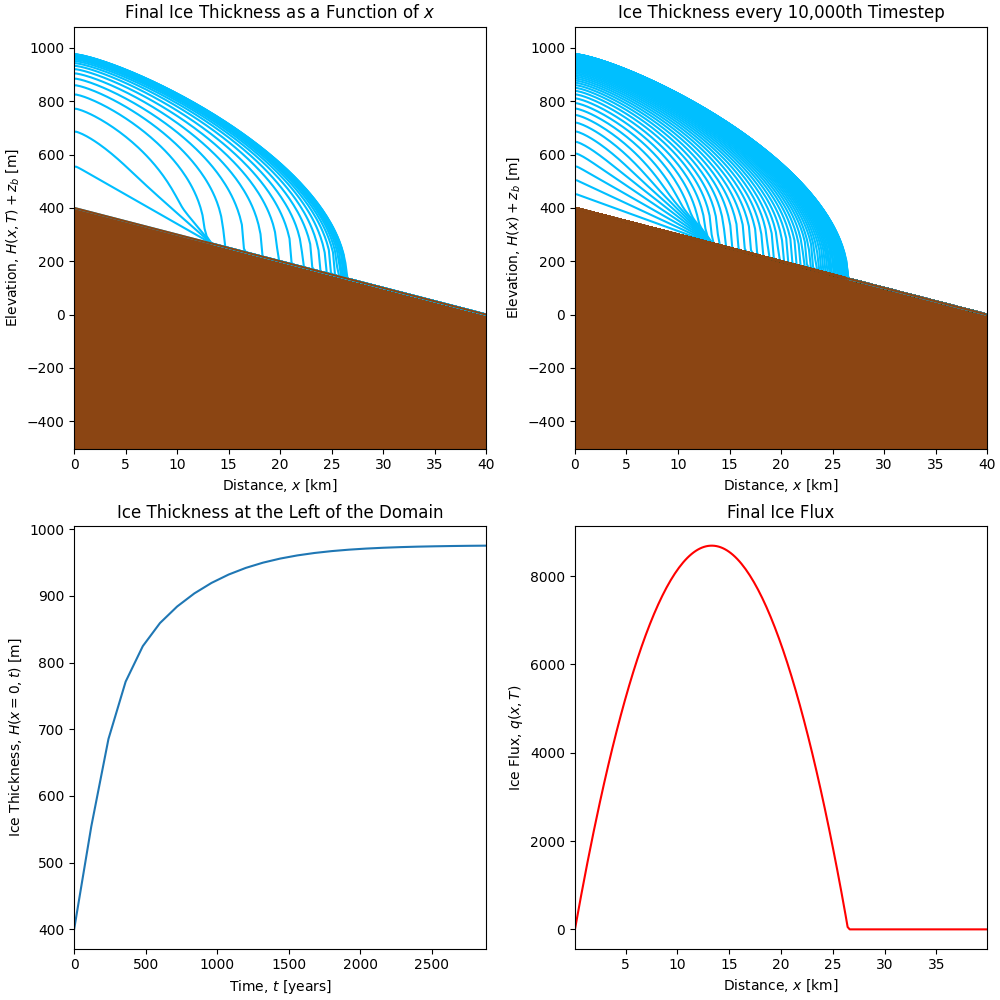

In [8]:
x, t, H, q_final, H_final, zb = sia_varying_bed()

## 7) Animate the model results

In [9]:
## Use this code to plot an animation of your model results. 

# imports: you may need to import `conda install ipympl`
%matplotlib widget
from matplotlib import animation, rc
from IPython.display import HTML
rc('animation', html='jshtml')

# define new H
H_new_zb = H+zb

def animate_ice_model_results(x, t, f, interval_between_timesteps = 5000, time_delay_between_frames = 100):
    # run this function by, e.g., `animate_ice_model_results(x, t, H)`

    # open a figure and an axes inside the figure
    fig, ax = plt.subplots()

    # set the limits of the axes
    ax.set_xlim(( x[0], x[-1]))    # the horizontal axis will go from 0 to X
    ax.set_ylim((np.min(f), np.max(f)))   # the vertical axis will got from the lowest point on the bed, to the highest

    # create an line object with no data, and suppress the plot 
    line, = ax.plot([], [], lw=1, color='cyan');
    #plt.plot(x,zb,color='saddlebrown');
    plt.fill_between(x, ((zb.min()+ H.min())-500), zb, color='saddlebrown')
    plt.ylim((zb.min()+ H.min())-500, (H.max()+zb.max()+100))
    plt.close()

    # define a function which updates the figure, given a timestep number. This function plots the line and updates the axis labels. 
    def animate(timestep):
        line.set_data(x, f[timestep,:])                 # update the data
        ax.fill_between(x, zb, f[timestep,:], color='cyan')
        ax.set_title(f"$t$ = {t[timestep]:.1f} years")  # update the title
        ax.set_xlabel("distance, $x$ [m]")              # update the x label
        #ax.set_ylabel("ice surface height, $z_s$ [m]")  # update the y label, change this if you want to plot something other than ice surface height
        ax.set_ylabel("elevation, $z_s$+$z_b$ [m]")  # update the y label, change this if you want to plot something other than ice surface height
        return line

    # setup the animation 
    anim = animation.FuncAnimation(fig, animate, 
                                   frames = np.arange(0, len(t), interval_between_timesteps),
                                   interval = time_delay_between_frames, 
                                   blit=True)
    
    # run this to save a gif of animation
#     writergif = animation.PillowWriter(fps=30) 
#     anim.save("animation.gif", writer=writergif)
    
    return anim
   
# run the function to display the animation
animate_ice_model_results(x, t, H_new_zb)

## 8) Run model and view results on retrograde slope

120.0 out of 3000 years
240.0 out of 3000 years
360.0 out of 3000 years
480.0 out of 3000 years
600.0 out of 3000 years
720.0 out of 3000 years
840.0 out of 3000 years
960.0 out of 3000 years
1080.0 out of 3000 years
1200.0 out of 3000 years
1320.0 out of 3000 years
1440.0 out of 3000 years
1560.0 out of 3000 years
1680.0 out of 3000 years
1800.0 out of 3000 years
1920.0 out of 3000 years
2040.0 out of 3000 years
2160.0 out of 3000 years
2280.0 out of 3000 years
2400.0 out of 3000 years
2520.0 out of 3000 years
2640.0 out of 3000 years
2760.0 out of 3000 years
2880.0 out of 3000 years


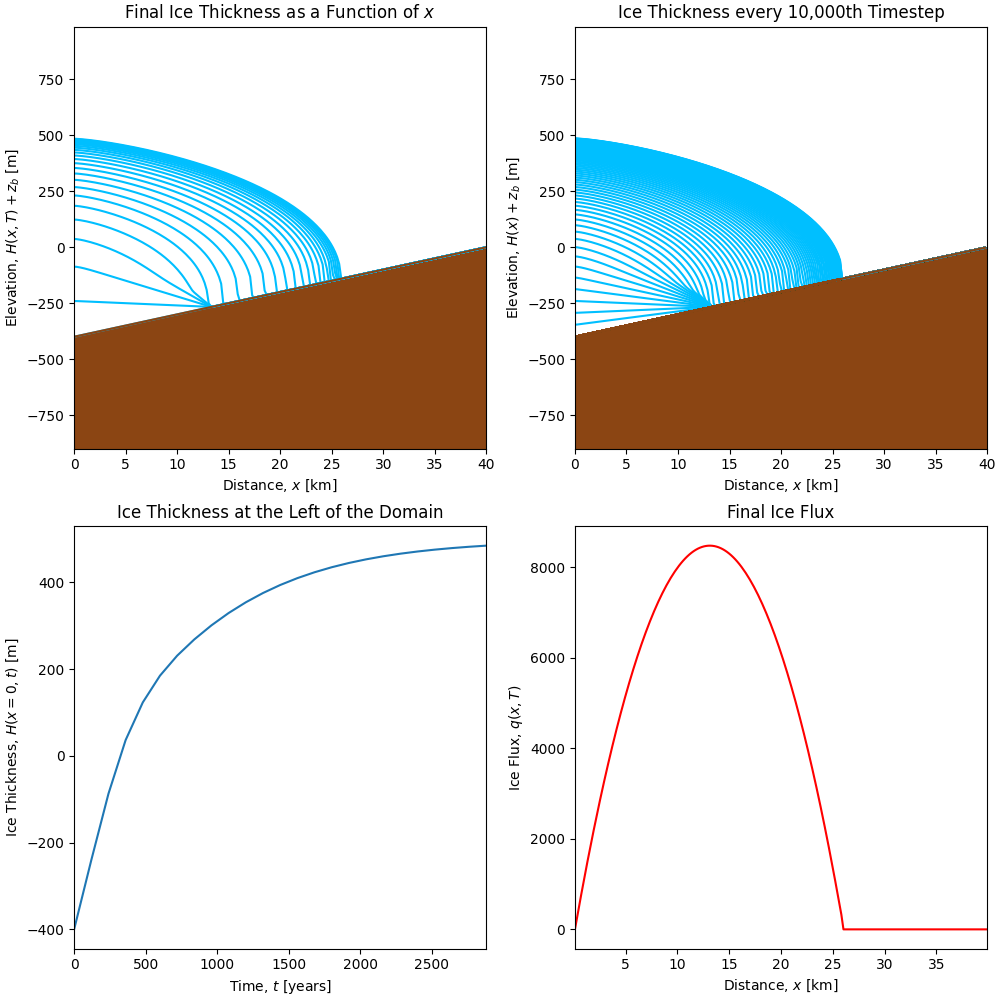

In [10]:
x, t, H, q_final, H_final, zb = sia_varying_bed(bed_slope = 0.01)

## 9) Animate the model results

In [11]:
## Use this code to plot an animation of your model results. 

# imports: you may need to import `conda install ipympl`
%matplotlib widget
from matplotlib import animation, rc
from IPython.display import HTML
rc('animation', html='jshtml')

# define new H
H_new_zb = H+zb

def animate_ice_model_results(x, t, f, interval_between_timesteps = 5000, time_delay_between_frames = 100):
    # run this function by, e.g., `animate_ice_model_results(x, t, H)`

    # open a figure and an axes inside the figure
    fig, ax = plt.subplots()

    # set the limits of the axes
    ax.set_xlim(( x[0], x[-1]))    # the horizontal axis will go from 0 to X
    ax.set_ylim((np.min(f), np.max(f)))   # the vertical axis will got from the lowest point on the bed, to the highest

    # create an line object with no data, and suppress the plot 
    line, = ax.plot([], [], lw=1, color='cyan');
    #plt.plot(x,zb,color='saddlebrown');
    plt.fill_between(x, ((zb.min()+ H.min())-500), zb, color='saddlebrown')
    plt.ylim((zb.min()+ H.min())-500, (H.max()+zb.max()+100))
    plt.close()

    # define a function which updates the figure, given a timestep number. This function plots the line and updates the axis labels. 
    def animate(timestep):
        line.set_data(x, f[timestep,:])                 # update the data
        ax.fill_between(x, zb, f[timestep,:], color='cyan')
        ax.set_title(f"$t$ = {t[timestep]:.1f} years")  # update the title
        ax.set_xlabel("distance, $x$ [m]")              # update the x label
        #ax.set_ylabel("ice surface height, $z_s$ [m]")  # update the y label, change this if you want to plot something other than ice surface height
        ax.set_ylabel("elevation, $z_s$+$z_b$ [m]")  # update the y label, change this if you want to plot something other than ice surface height
        return line

    # setup the animation 
    anim = animation.FuncAnimation(fig, animate, 
                                   frames = np.arange(0, len(t), interval_between_timesteps),
                                   interval = time_delay_between_frames, 
                                   blit=True)
    
    # run this to save a gif of animation
#     writergif = animation.PillowWriter(fps=30) 
#     anim.save("animation.gif", writer=writergif)
    
    return anim
   
# run the function to display the animation
animate_ice_model_results(x, t, H_new_zb)

## 10) Download Data from the [National Snow and Ice Data Center](https://nsidc.org/home)

1. [MEaSUREs BedMachine Antarctica, Version 3](https://nsidc.org/data/nsidc-0756/versions/3) <br />
This dataset contains a bed topography/bathymetry map of Antarctica collected as part of the NASA Making Earth System Data Records for Use in Research Environments (MEaSUREs) program.
1. [MEaSUREs Antarctic Boundaries for IPY 2007-2009 from Satellite Radar, Version 2](https://nsidc.org/data/nsidc-0709/versions/2) <br />
This dataset contains maps of Antarctic ice shelves, Antarctic basins, and the Antarctic coastline as part of the NASA Making Earth System Data Records for Use in Research Environments (MEaSUREs) program.

In [12]:
# # Download BedMachine3 dataset
# %run Download_Data_Scripts/MEaSUREs_BedMachine_Antarctica_v3.ipynb

In [13]:
# Download MEaSUREs Antarctic Boundaries dataset
# %run Download_Data_Scripts/MEaSUREs_Antarctic_Boundaries_IPY_2007-2009_Satellite_Radar_v2.ipynb

## 11) Load and plot MEaSUREs BedMachine3 Antarctica data

In [14]:
# load MEaSUREs BedMachine3 Antarctica data into xarray dataset
ds_bedmachine3 = xr.open_dataset('BedMachineAntarctica-v3.nc')
ds_bedmachine3

<xarray.Dataset>
Dimensions:    (x: 13333, y: 13333)
Coordinates:
  * x          (x) int32 -3333000 -3332500 -3332000 ... 3332000 3332500 3333000
  * y          (y) int32 3333000 3332500 3332000 ... -3332000 -3332500 -3333000
Data variables:
    mapping    |S1 ...
    mask       (y, x) int8 ...
    firn       (y, x) float32 ...
    surface    (y, x) float32 ...
    thickness  (y, x) float32 ...
    bed        (y, x) float32 ...
    errbed     (y, x) float32 ...
    source     (y, x) int8 ...
    dataid     (y, x) int8 ...
    geoid      (y, x) int16 ...
Attributes: (12/17)
    Conventions:                 CF-1.7
    Title:                       BedMachine Antarctica
    Author:                      Mathieu Morlighem
    version:                     03-Jun-2022 (v3.4)
    nx:                          13333.0
    ny:                          13333.0
    ...                          ...
    ymax:                        3333000
    spacing:                     500
    no_data:                     -9999.0
    license:                     No restrictions on access or use
    Data_citation:               Morlighem M. et al., (2019), Deep glacial tr...
    Notes:                       Data processed at the Department of Earth Sy...

In [15]:
# keep attributes for BedMachine3
xr.set_options(keep_attrs=True);

In [16]:
# create subset DataArray of bedmachine2 bed data variable
bedmachine3_bed = ds_bedmachine3.bed
bedmachine3_bed

<xarray.DataArray 'bed' (y: 13333, x: 13333)>
[177768889 values with dtype=float32]
Coordinates:
  * x        (x) int32 -3333000 -3332500 -3332000 ... 3332000 3332500 3333000
  * y        (y) int32 3333000 3332500 3332000 ... -3332000 -3332500 -3333000
Attributes:
    long_name:      bed topography
    standard_name:  bedrock_altitude
    units:          meters
    grid_mapping:   mapping
    source:         IBCSO v2 and Mathieu Morlighem

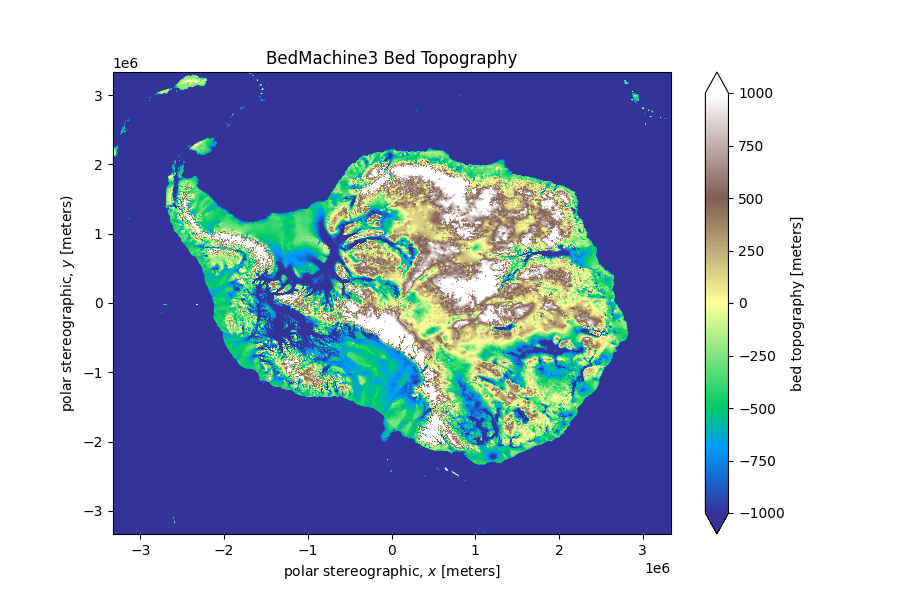

In [17]:
# plot MEaSUREs BedMachine3 Bed Topography Data
fig, ax = plt.subplots(figsize=(9,6))

ds_bedmachine3.bed.plot(cmap='terrain',vmin=-1000, vmax=1000);
plt.xlabel('polar stereographic, $x$ [meters]')
plt.ylabel('polar stereographic, $y$ [meters)')
plt.title('BedMachine3 Bed Topography');

## 12) Load and plot Bedmap2 Bed Topography data

In [18]:
# load BedMap2 and Ice Velocity files
s = scipy.io.loadmat('MeasuredSpeed.mat')
b = scipy.io.loadmat('BedMap2_forP4.mat')

In [19]:
# Name Bedmap2 variables
Vx = s['Vx'] #X component of velocity
Vy = s['Vy'] #Y component of velocity
#x = s['x']
#x = np.squeeze(x)

#y = s['y']
#y = np.squeeze(y)

elev_bed = b['elev_bed']
elev_surf = b['elev_surf']
slope = b['slope']
thickness = b['thickness']
x_bedmap = b['x_bedmap'][0,:]
y_bedmap = b['y_bedmap'][:,0]

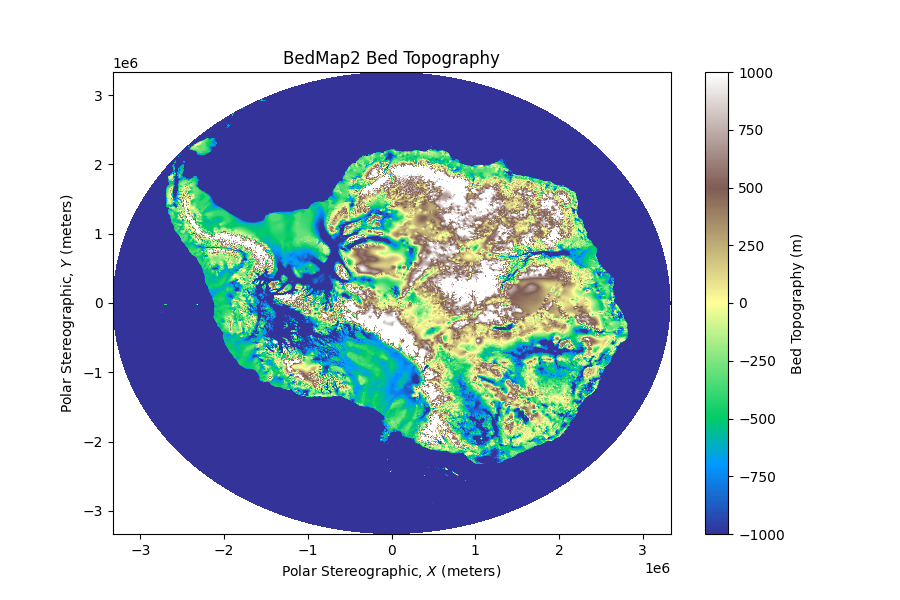

In [20]:
# plot BedMap2 Bed Topography Data
fig, ax = plt.subplots(figsize=(9,6))

plt.pcolormesh(x_bedmap, y_bedmap, elev_bed, cmap='terrain', clim = (-1000,1000))
plt.colorbar(label='Bed Topography (m)')
plt.title('BedMap2 Bed Topography')
plt.xlabel('Polar Stereographic, $X$ (meters)')
plt.ylabel('Polar Stereographic, $Y$ (meters)');

## 13) Load and plot MEaSUREs Antarctic Boundaries for IPY 2007-2009 from Satellite Radar, Version 2 data

In [21]:
# load Antarctic Coastline shapefile from MEaSUREs
cl = gpd.read_file('Coastline_Antarctica_v02.shp')
#cl

# load Antarctic grounding line shapefile from MEaSUREs
gl = gpd.read_file('GroundingLine_Antarctica_v02.shp')
#gl

# load Antarctic ice boundary shapefile from MEaSUREs
ice_boundaries = gpd.read_file('IceBoundaries_Antarctica_v02.shp')
#ice_boundaries

# load Antarctic basins shapefile from MEaSUREs
basins = gpd.read_file('Basins_Antarctica_v02.shp')
#basins

# load Antarctic IMBIE basins shapefile from MEaSUREs
basins_IMBIE = gpd.read_file('Basins_IMBIE_Antarctica_v02.shp')
#basins_IMBIE

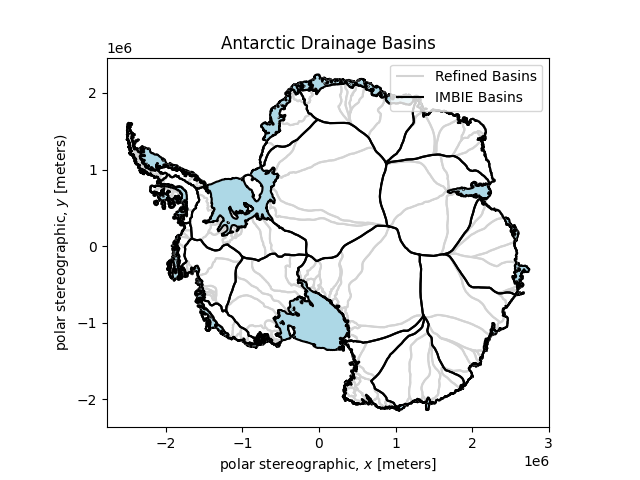

In [22]:
# plot MEaSUREs Antarctic Drainage Basins
fig, ax = plt.subplots()

##ice_boundaries.geometry.boundary.plot(color='black', ax=ax)
cl.geometry.boundary.plot(color='black',ax=ax, label = '')
cl.geometry.plot(color='lightblue',ax=ax, label='Floating Ice')
gl.geometry.plot(color='white', ax=ax, label='Grounded Ice')
#basins.geometry.boundary.plot(color ='black', linestyle=':', ax=ax, label='Refined Basins');
basins.geometry.boundary.plot(color ='lightgrey', ax=ax, label='Refined Basins');
basins_IMBIE.geometry.boundary.plot(color ='black', ax=ax, label='IMBIE Basins');
plt.xlabel('polar stereographic, $x$ [meters]')
plt.ylabel('polar stereographic, $y$ [meters)')
plt.title('Antarctic Drainage Basins');
plt.legend();
#plt.legend(title='Antarctic Drainage Basins', loc='center left', bbox_to_anchor=(1, 0.5));

## 14) Choose drainage basin profile to sample bed topography data onto with interactive pop-up window
Use this interactive pop-up window to choose the drainage basin to run the model over. Click on start and end points.

In [23]:
# # Interactive pop-up window of Antarctica Drainage Basins to choose profile to sample bed topography data to
# import matplotlib
# matplotlib.use( 'tkagg' )
# fig, ax = plt.subplots()
# #plt.figure()
# ##ice_boundaries.geometry.boundary.plot(color='black', ax=ax)
# cl.geometry.boundary.plot(color='black',ax=ax, label = '')
# cl.geometry.plot(color='lightblue',ax=ax, label='Floating Ice')
# gl.geometry.plot(color='white', ax=ax, label='Grounded Ice')
# #basins.geometry.boundary.plot(color ='black', linestyle=':', ax=ax, label='Refined Basins');
# basins.geometry.boundary.plot(color ='lightgrey', ax=ax, label='Refined Basins');
# basins_IMBIE.geometry.boundary.plot(color ='black', ax=ax, label='IMBIE Basins');
# plt.xlabel('polar stereographic, $x$ [meters]')
# plt.ylabel('polar stereographic, $y$ [meters)')
# plt.title('Antarctic Drainage Basins');
# p = plt.ginput(2)
# plt.show()
# x1, y1 = p[0]
# x2, y2 = p[1]
# print(x1, y1)
# print(x2, y2)
# %matplotlib inline

## 15) Example Basin #1: Byrd Glacier
Uncomment and run this cell to see the model run over Byrd Glacier.

In [24]:
# Example 1: Byrd GLacier Drainage Basin Points
x1, y1, x2, y2 = (1142211.3276761016, -38333.93977258867,
329144.9736345699, -919155.8233175813)

## 16) Example Basin #2: Thwaites Glacier
Uncomment and run this cell to see the model run over Thwaites Glacier.

In [25]:
# # Example 2: Thwaites Glacier Drainage Basin Points
x1, y1, x2, y2 = (-1093890.5347618689, -377111.58728989353,
-1520750.3706336734, -438091.56384300813)

## 17) Generate X and Y arrays between two selected points

In [26]:
# Generate X and Y arrays between the two points you selected
x_i = np.linspace(x1, x2, 200)
y_i = np.linspace(y1, y2, 200)

## 18) Compute distance in meters along profile

In [27]:
#Compute distance along profile (meters)
d = np.sqrt(np.diff(y_i)**2 + np.diff(x_i)**2)
d = np.insert(np.cumsum(d), 0, 0)

# round X_km to 0 decimals
d = d.round(decimals=0)
#d

## 19) Plot profile over Antarctica

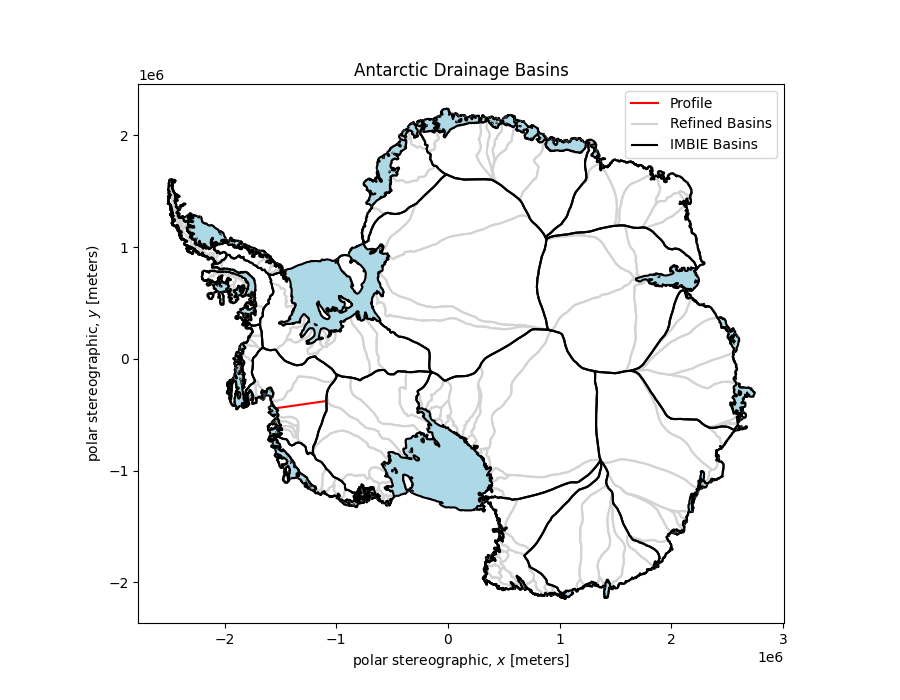

In [28]:
# # Plot profile line over Antarctic Drainage Basins
fig, ax = plt.subplots(figsize=(9,7))

plt.plot(x_i, y_i, '-', c='red', label='Profile')
##ice_boundaries.geometry.boundary.plot(color='black', ax=ax)
cl.geometry.boundary.plot(color='black',ax=ax, label = '')
cl.geometry.plot(color='lightblue',ax=ax, label='Floating Ice')
gl.geometry.plot(color='white', ax=ax, label='Grounded Ice')
#basins.geometry.boundary.plot(color ='black', linestyle=':', ax=ax, label='Refined Basins');
basins.geometry.boundary.plot(color ='lightgrey', ax=ax, label='Refined Basins');
basins_IMBIE.geometry.boundary.plot(color ='black', ax=ax, label='IMBIE Basins');
plt.xlabel('polar stereographic, $x$ [meters]')
plt.ylabel('polar stereographic, $y$ [meters)')
plt.title('Antarctic Drainage Basins');
plt.legend();
#plt.legend(title='Antarctic Drainage Basins', loc='center left', bbox_to_anchor=(1, 0.5));

In [29]:
# # Uncomment this code to save figure of profile over Antarctic Drainage Basins
# fig.savefig("Antarctic Drainage Basin_Profile.png", bbox_inches='tight', dpi=600)

## 20) Run the following cells to incorporate Bedmap2 Bed Topography into model (see #19 for BedMachine3)

In [30]:
# Sample Bedmap2 bed topography to profile
bed_topo_interp = scipy.interpolate.RegularGridInterpolator((y_bedmap, x_bedmap), elev_bed)
zb = bed_topo_interp((y_i, x_i))
#zb

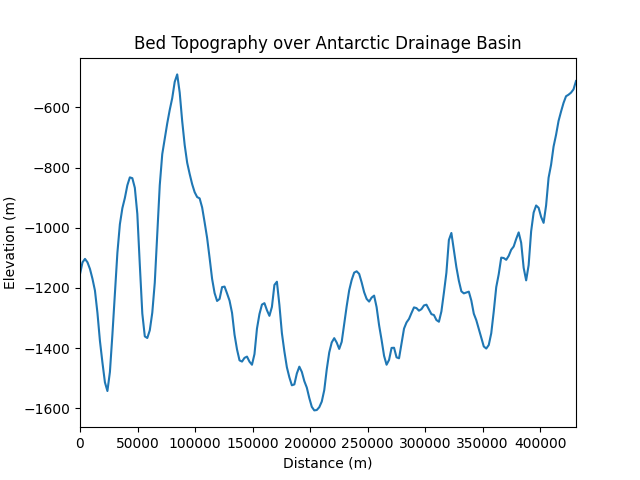

In [31]:
# plot interpolated bed topography profile
fig, ax = plt.subplots()

plt.plot(d, bed_topo_interp((y_i, x_i)))
plt.xlabel('Distance (m)')
plt.ylabel('Elevation (m)')
plt.title('Bed Topography over Antarctic Drainage Basin')
plt.margins(x=0)

120.0 out of 3000 years
240.0 out of 3000 years
360.0 out of 3000 years
480.0 out of 3000 years
600.0 out of 3000 years
720.0 out of 3000 years
840.0 out of 3000 years
960.0 out of 3000 years
1080.0 out of 3000 years
1200.0 out of 3000 years
1320.0 out of 3000 years
1440.0 out of 3000 years
1560.0 out of 3000 years
1680.0 out of 3000 years
1800.0 out of 3000 years
1920.0 out of 3000 years
2040.0 out of 3000 years
2160.0 out of 3000 years
2280.0 out of 3000 years
2400.0 out of 3000 years
2520.0 out of 3000 years
2640.0 out of 3000 years
2760.0 out of 3000 years
2880.0 out of 3000 years


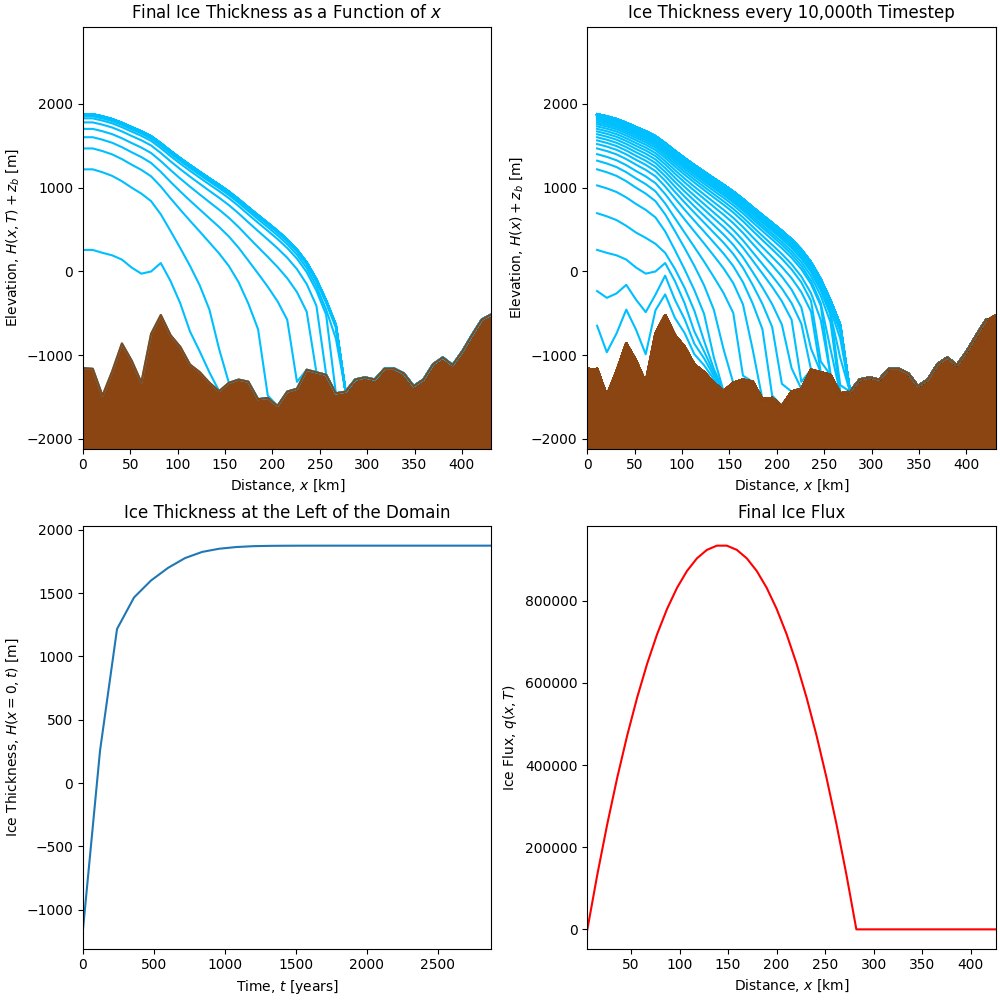

In [32]:
# run sia_varying_bed function
x, t, H, q_final, H_final, zb = sia_varying_bed(X=d.max(), dx=10000, bed = False, bedmap2=True)

## 21) Animate the model results

In [33]:
## Use this code to plot an animation of your model results. 

# imports: you may need to import `conda install ipympl`
%matplotlib widget
from matplotlib import animation, rc
from IPython.display import HTML
rc('animation', html='jshtml')

# define new H
H_new_zb = H+zb

def animate_ice_model_results(x, t, f, interval_between_timesteps = 5000, time_delay_between_frames = 100):
    # run this function by, e.g., `animate_ice_model_results(x, t, H)`

    # open a figure and an axes inside the figure
    fig, ax = plt.subplots()

    # set the limits of the axes
    ax.set_xlim(( x[0], x[-1]))    # the horizontal axis will go from 0 to X
    ax.set_ylim((np.min(f), np.max(f)))   # the vertical axis will got from the lowest point on the bed, to the highest

    # create an line object with no data, and suppress the plot 
    line, = ax.plot([], [], lw=1, color='cyan');
    #plt.plot(x,zb,color='saddlebrown');
    plt.fill_between(x, ((zb.min()+ H.min())-500), zb, color='saddlebrown')
    plt.ylim((zb.min()+ H.min())-500, (H.max()+zb.max()+100))
    plt.close()

    # define a function which updates the figure, given a timestep number. This function plots the line and updates the axis labels. 
    def animate(timestep):
        line.set_data(x, f[timestep,:])                 # update the data
        ax.fill_between(x, zb, f[timestep,:], color='cyan')
        ax.set_title(f"$t$ = {t[timestep]:.1f} years")  # update the title
        ax.set_xlabel("distance, $x$ [m]")              # update the x label
        #ax.set_ylabel("ice surface height, $z_s$ [m]")  # update the y label, change this if you want to plot something other than ice surface height
        ax.set_ylabel("elevation, $z_s$+$z_b$ [m]")  # update the y label, change this if you want to plot something other than ice surface height
        return line

    # setup the animation 
    anim = animation.FuncAnimation(fig, animate, 
                                   frames = np.arange(0, len(t), interval_between_timesteps),
                                   interval = time_delay_between_frames, 
                                   blit=True)
    
    # run this to save a gif of animation
#     writergif = animation.PillowWriter(fps=30) 
#     anim.save("animation.gif", writer=writergif)
    
    return anim
   
# run the function to display the animation
animate_ice_model_results(x, t, H_new_zb)

## 22) Run the following cells to incorporate BedMachine3 Bed Topography into model (see #18 for Bedmap2)

In [34]:
# Create DataFrame of X and Y arrays
XY = {'X': x_i, 'Y': y_i}
df_XY = pd.DataFrame(data=XY)
#df_XY

In [35]:
# Add computed distance to DataFrame
df_XY['distance_m'] = d
#df_XY

In [36]:
# change index to distance_m
df_XY = df_XY.set_index(['distance_m'])
#df_XY

In [37]:
# change DataFrame to Xarray DataSet
df_XY = df_XY.to_xarray()
df_XY

<xarray.Dataset>
Dimensions:     (distance_m: 200)
Coordinates:
  * distance_m  (distance_m) float64 0.0 2.167e+03 ... 4.29e+05 4.312e+05
Data variables:
    X           (distance_m) float64 -1.094e+06 -1.096e+06 ... -1.521e+06
    Y           (distance_m) float64 -3.771e+05 -3.774e+05 ... -4.381e+05

In [38]:
# designate X and Y coordinates for sampling BedMachine3 bed onto 
x_zb = df_XY.X
y_zb = df_XY.Y

In [39]:
# sample BedMachine2 bed DataArray along OIB survey line
zb = bedmachine3_bed.interp(x=x_zb,y=y_zb)
#zb

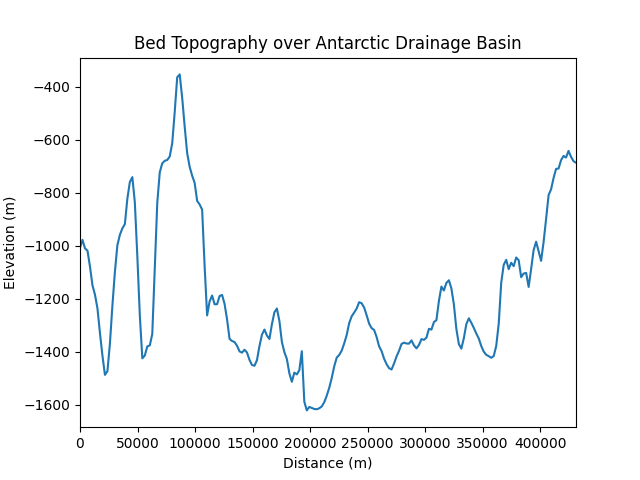

In [40]:
# plot interpolated bed topography profile
fig, ax = plt.subplots()

plt.plot(d, zb)
plt.xlabel('Distance (m)')
plt.ylabel('Elevation (m)')
plt.title('Bed Topography over Antarctic Drainage Basin')
plt.margins(x=0)

120.0 out of 3000 years
240.0 out of 3000 years
360.0 out of 3000 years
480.0 out of 3000 years
600.0 out of 3000 years
720.0 out of 3000 years
840.0 out of 3000 years
960.0 out of 3000 years
1080.0 out of 3000 years
1200.0 out of 3000 years
1320.0 out of 3000 years
1440.0 out of 3000 years
1560.0 out of 3000 years
1680.0 out of 3000 years
1800.0 out of 3000 years
1920.0 out of 3000 years
2040.0 out of 3000 years
2160.0 out of 3000 years
2280.0 out of 3000 years
2400.0 out of 3000 years
2520.0 out of 3000 years
2640.0 out of 3000 years
2760.0 out of 3000 years
2880.0 out of 3000 years


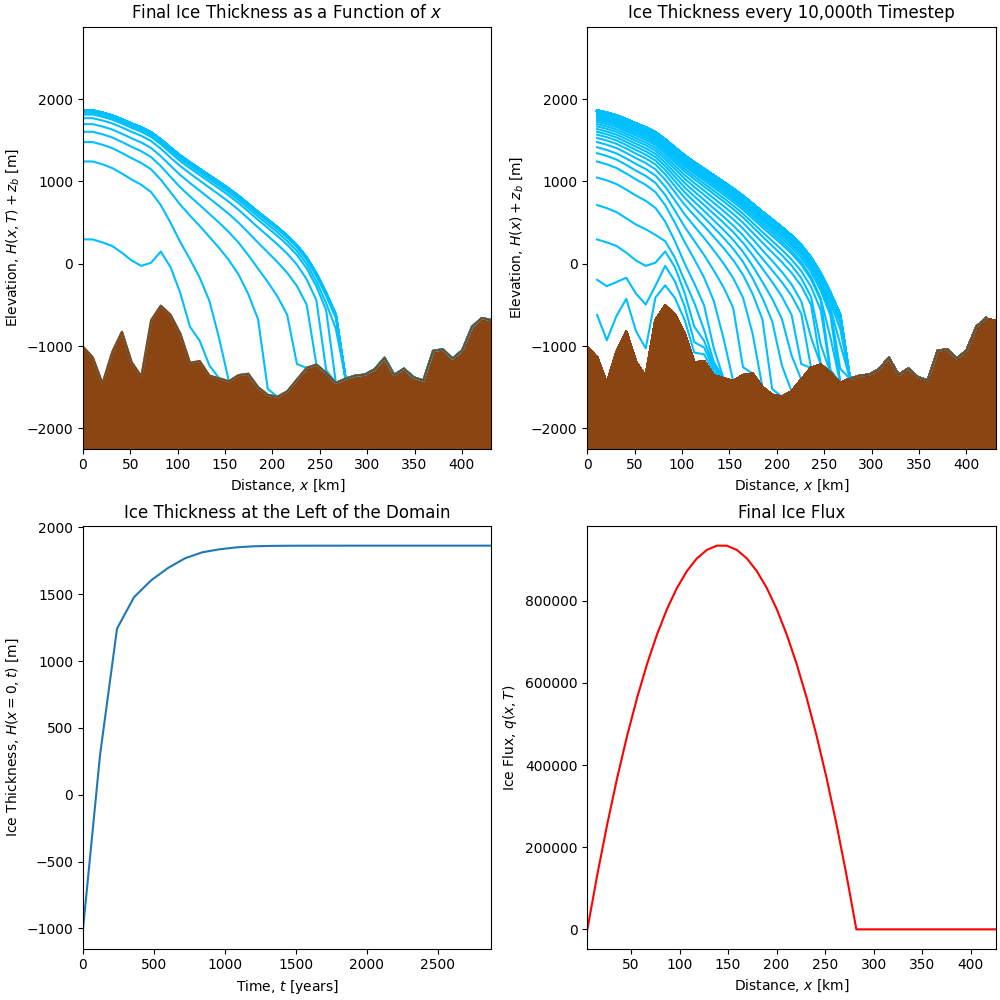

In [41]:
# run sia_varying_bed function
x, t, H, q_final, H_final, zb = sia_varying_bed(X=d.max(), dx=10000, bed = False, bedmap2 = False, bedmachine3=True)

## 23) Animate the model results

## 24) Select Figures from Final Project

## SIA over prograde slope <br />
SIA model run over a simple prograde slope. <br />
<br />
![SIA over prograde slope.](SIA_prograde_slope.png) <br />
![SIA over prograde slope.](SIA_prograde_slope_animation.gif) <br />
***
## SIA over retrograde slope <br />
SIA model run over a simple retrograde slope. <br />
<br />
![SIA over retrograde slope.](SIA_retrograde_slope.png) <br />
![SIA over retrograde slope.](SIA_retrograde_slope_animation.gif) <br />
***
## MEaSUREs Antarctic Drainage Basins with profile over Thwaites Glacier: <br />
IMBIE and refined MEaSUREs Antarctic Drainage Basins. <br />
<br />
![MEaSUREs Antarctic Drainage Basins.](Antarctic_Drainage_Basin_Thwaites.png) <br />

## SIA over Thwaites Glacier with Bedmap2 bed topography <br />
SIA model run over Bedmap2 bed topography. <br />
<br />
![SIA over prograde slope.](SIA_Thwaites_Bedmap2_Bed_Topography.png) <br />
![SIA over prograde slope.](Thwaites_Glacier_Bedmap2_animation.gif) <br />

## SIA over Thwaites Glacier with BedMachine3 bed topography <br />
SIA model run over BedMachine3 bed topography. <br />
<br />
![SIA over prograde slope.](SIA_Thwaites_BedMachine3_Bed_Topography.png) <br />
![SIA over prograde slope.](Thwaites_Glacier_BedMachine3_animation.gif)
***